# Test uniformity of HoloPhAg hologram with Halpha filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [2]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanHoloPhAg_Halpha
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanHoloPhAg_Halpha


### Input directory

In [4]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=291
MAX_IMGNUMBER=315
date = "20170609"
tag = "trim"
holo_name = "HoloPhAg"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [5]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [6]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

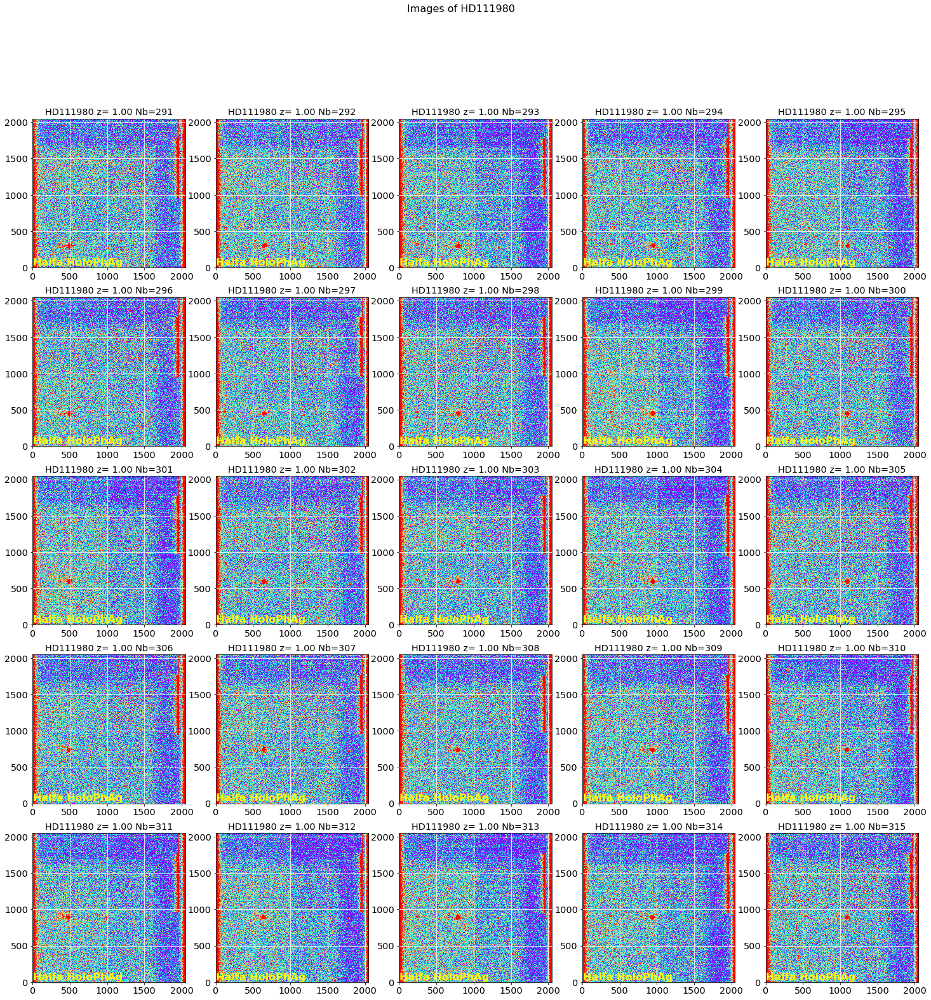

In [6]:
ShowImages(all_images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

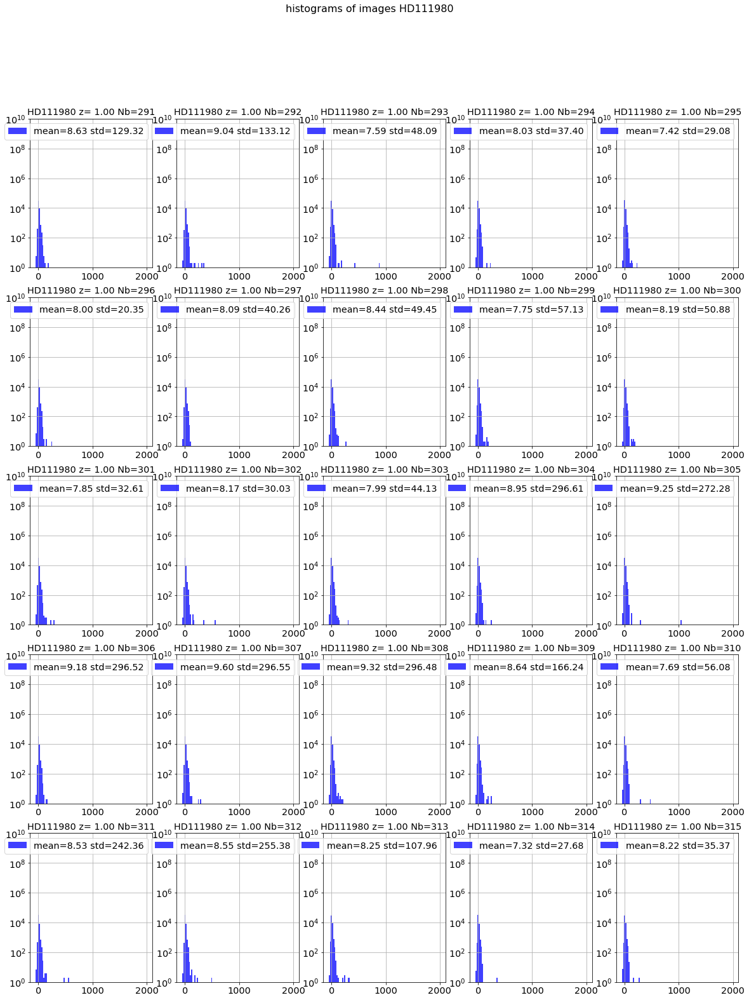

In [7]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

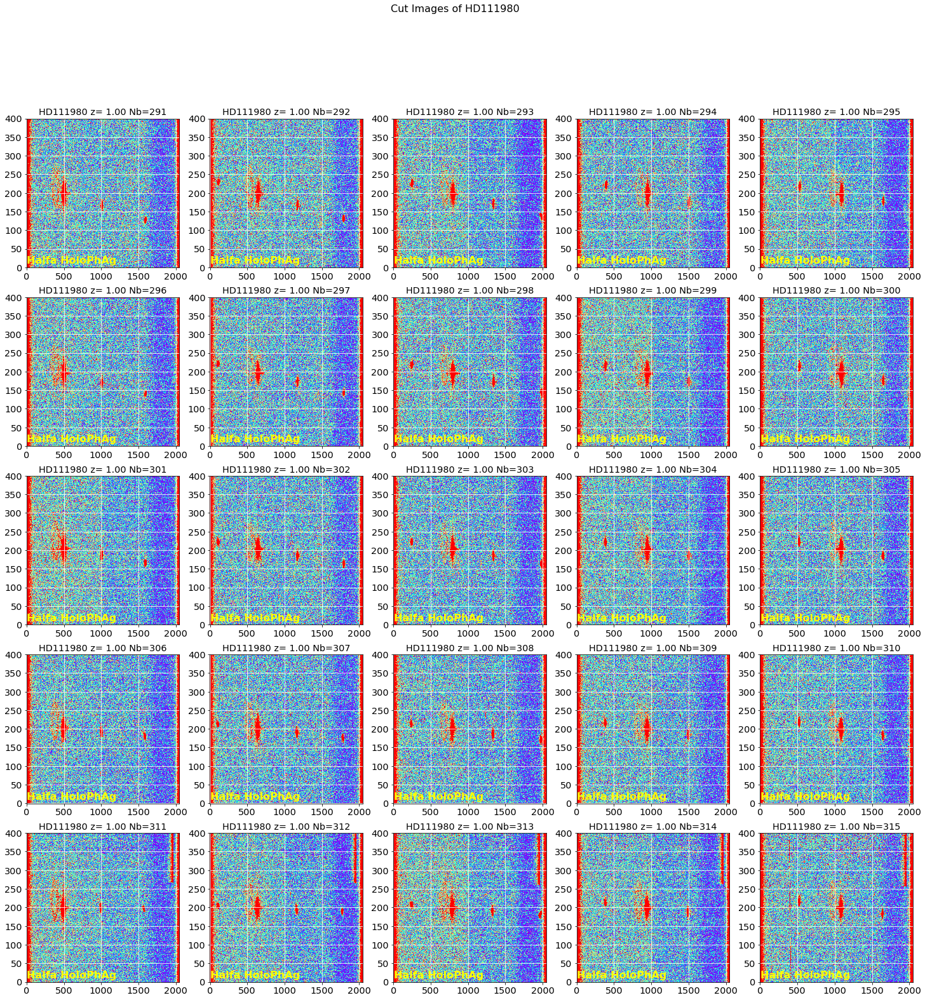

In [7]:
x_guess = [490,  650, 800, 950, 1100]*5
y_guess = [[300]*5, [450]*5, [590]*5, [740]*5, [890]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[200]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

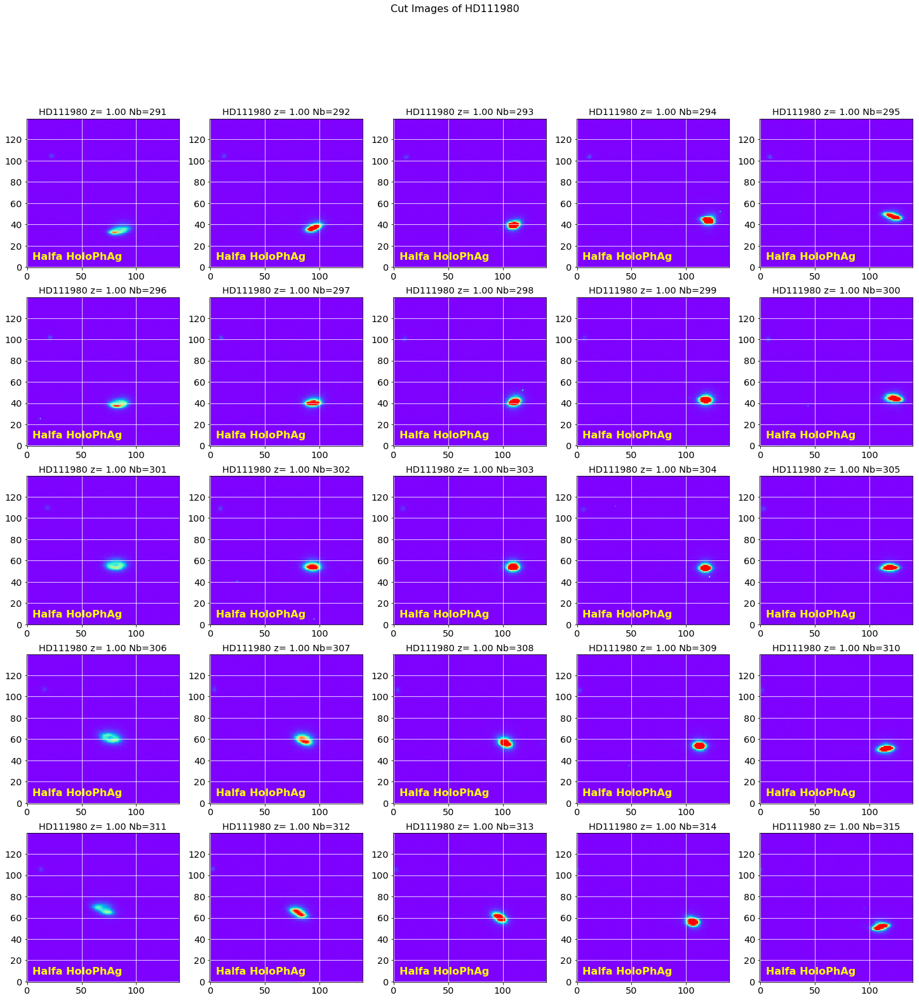

In [198]:
# Raw right order
x_guess_rightorder = [990,  1150, 1300, 1450, 1600]*5
y_guess_rightorder = [200]*25
DeltaY_rightorder=[70]*len(all_images)
DeltaX_rightorder=[70]*len(all_images)  # must be very large to be able to compute incident angle
tmp=ShowCenterImages(x_guess_rightorder,y_guess_rightorder,DeltaX_rightorder,DeltaY_rightorder,images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)

### Save cut images

In [8]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

trim_20170609_291.fits
trim_20170609_292.fits
trim_20170609_293.fits
trim_20170609_294.fits
trim_20170609_295.fits
trim_20170609_296.fits
trim_20170609_297.fits
trim_20170609_298.fits
trim_20170609_299.fits
trim_20170609_300.fits
trim_20170609_301.fits
trim_20170609_302.fits
trim_20170609_303.fits
trim_20170609_304.fits
trim_20170609_305.fits
trim_20170609_306.fits
trim_20170609_307.fits
trim_20170609_308.fits
trim_20170609_309.fits
trim_20170609_310.fits
trim_20170609_311.fits
trim_20170609_312.fits
trim_20170609_313.fits
trim_20170609_314.fits
trim_20170609_315.fits


In [9]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_291.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_292.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_293.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_294.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_295.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_296.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_297.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_298.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_299.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_300.fits
-rw-r--r--  1 jneveu  staff  6566400 10 aoû 16:19 cut_fitsimages/cutimg_20170609_301.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [10]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [11]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

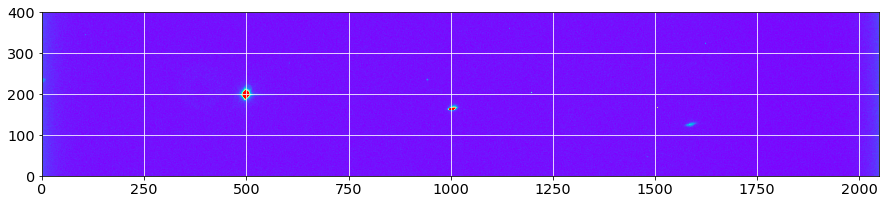

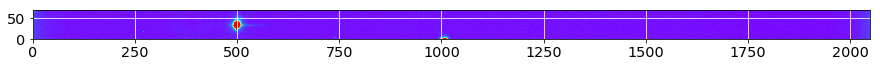

In [12]:
sel=0
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 35
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [13]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

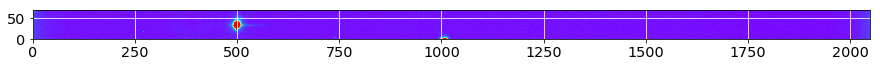

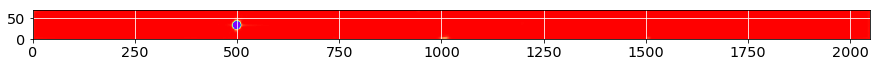

In [14]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 655


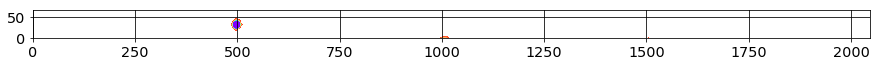

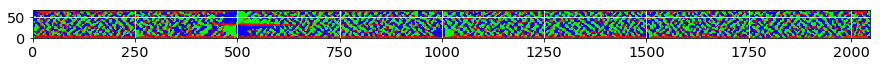

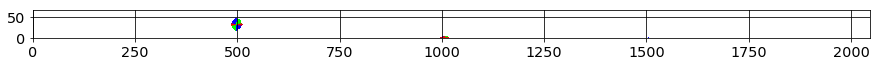

In [15]:
lambda_threshold = -7
margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 197


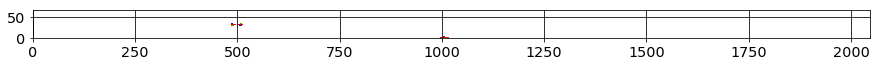

In [16]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : 0.260179016664


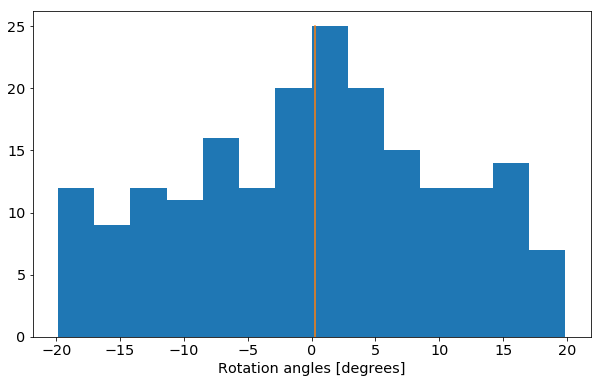

In [17]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

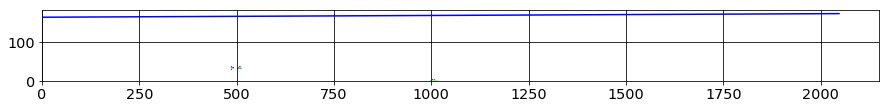

In [18]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -3.49552287765


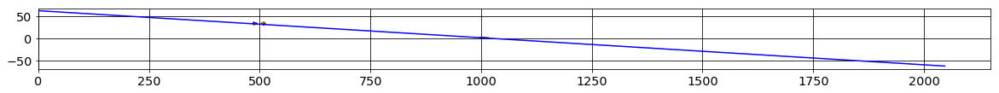

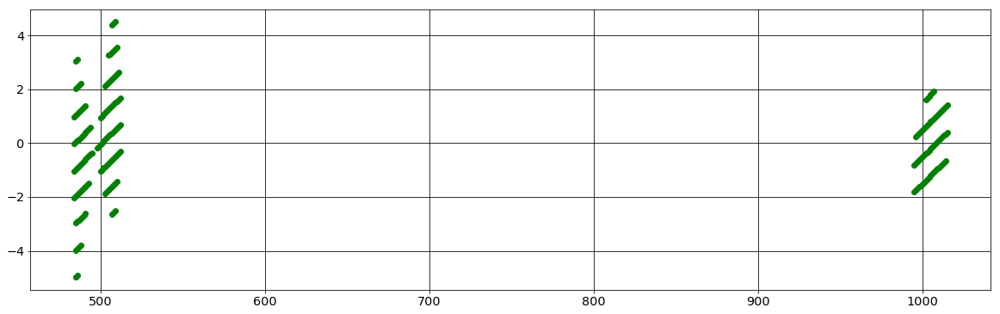

In [19]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -3.49552287765
1  theta =  -3.22924560188
2  theta =  -2.80797544196
3  theta =  -2.39275573399
4  theta =  -1.97857638563
5  theta =  -3.01883243001
6  theta =  -2.63792142714
7  theta =  -2.40703246357
8  theta =  -2.16507048591
9  theta =  -1.95182331121
10  theta =  -1.92450128347
11  theta =  -1.86636402621
12  theta =  -1.81868290641
13  theta =  -1.9100037275
14  theta =  -1.90301945281
15  theta =  -1.14452762167
16  theta =  -1.23675716452
17  theta =  -1.42950697711
18  theta =  -1.61500030036
19  theta =  -1.83822277775
20  theta =  -0.215535766506
21  theta =  -0.498358256284
22  theta =  -0.908198773331
23  theta =  -1.32545783289
24  theta =  -1.74720441076


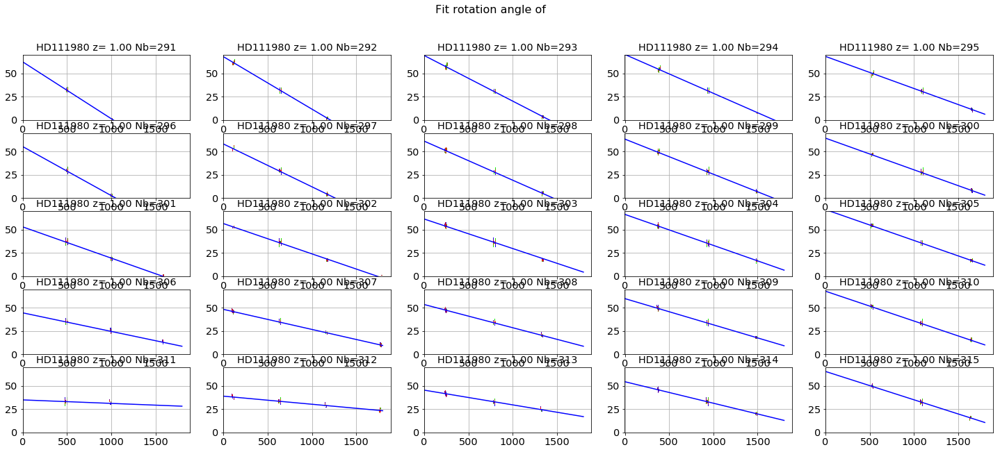

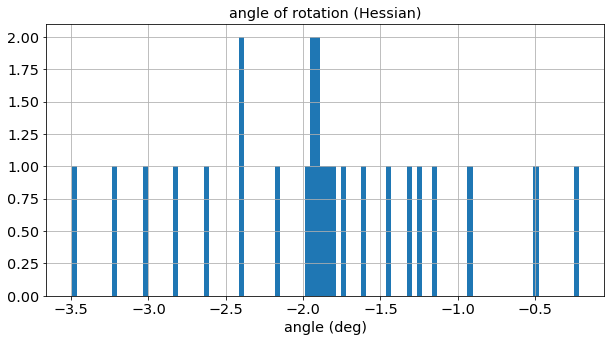

In [20]:
all_theta=ComputeRotationAngleHessianAndFit(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 20, width_cut = 35, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

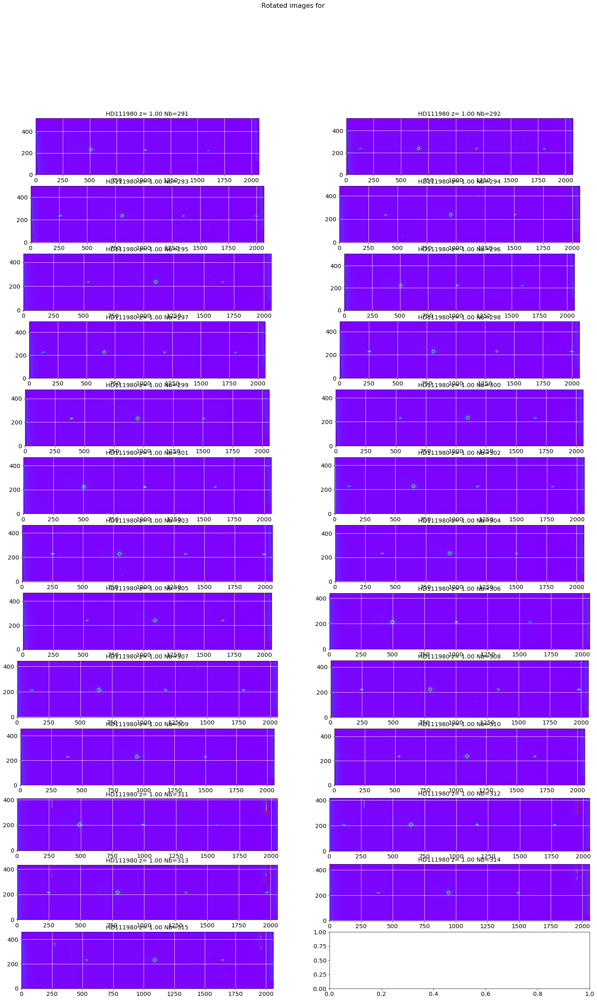

In [21]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([ -4.02477839e-01,  -5.20059242e-03,   1.18239248e-02,
         2.90195265e-03,   1.13544112e-02,   5.01385650e-02,
        -1.98807070e-02,  -6.99206163e-03,  -8.71424471e-03,
        -1.15654063e-03,  -1.21405853e-01,  -1.00577782e-01,
        -9.11820546e-02,   7.96221950e-03,   2.84127247e-03,
         8.79219850e-03,  -2.39083472e-03,   2.58072869e-05,
        -3.24890445e-03,   2.05460957e-03,   3.76657288e-03,
         3.05114122e-03,   6.31912472e-03,   8.28596212e-03,
        -6.33524401e-03])

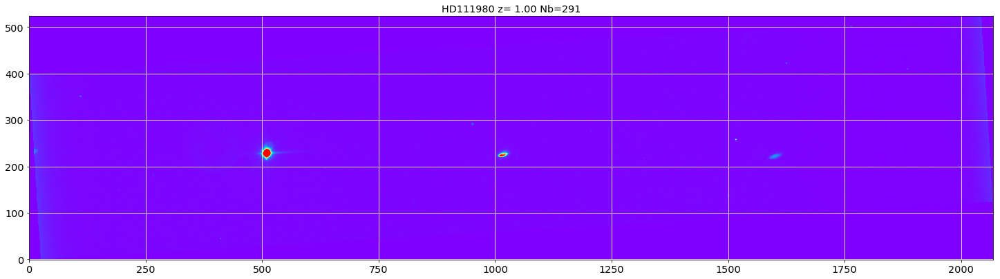

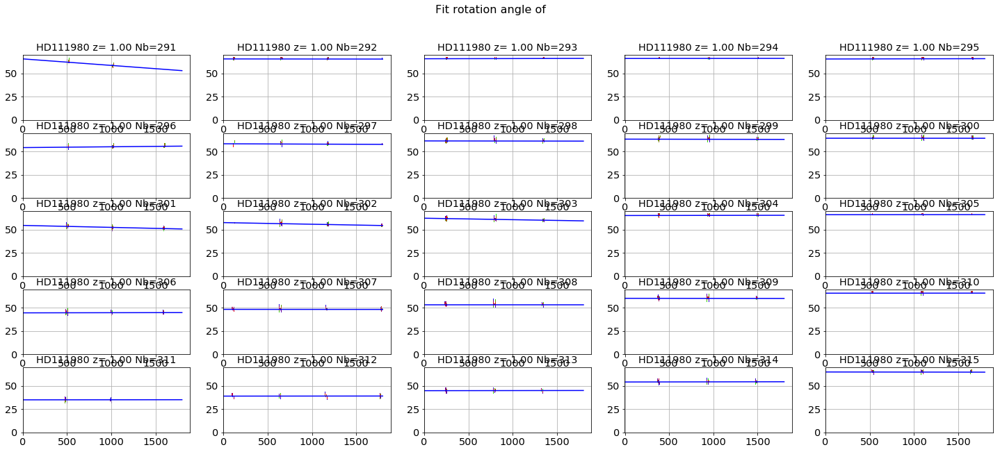

In [22]:
sel=0
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 20, width_cut = 35, right_edge = 1800)

Cut the extra spectra that pollute the images.

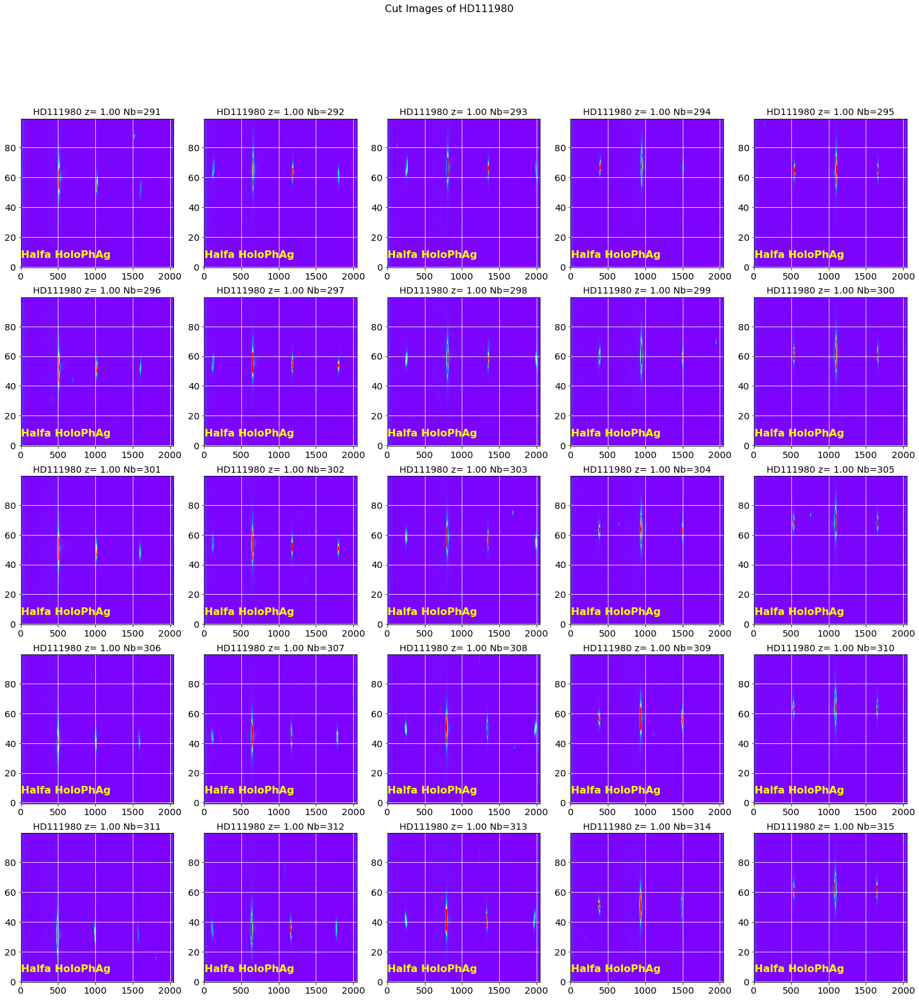

In [23]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [220]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=1000) 

# Find the central star locations
======================================

### Central star positions after rotation

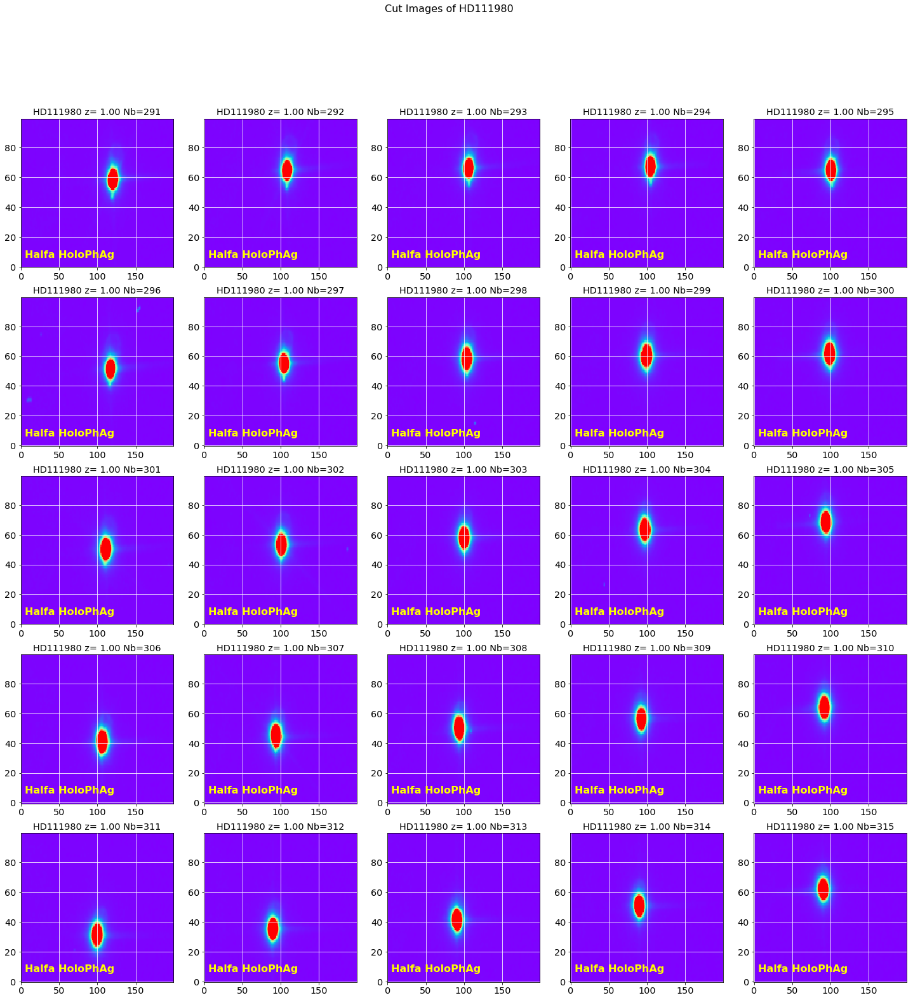

In [24]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [25]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  21.953279719 12.6032619104 46.3897962829
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 119.456557332 57.9339247773 ... 60344.8236341 8.10584198441 -2.27199533334
----------------------------------------------------------------
1  mean, median, std =  21.061011191 12.2662707465 43.1370232907
 id   xcentroid     ycentroid   ...      peak         flux         mag      
--- ------------- ------------- ... ------------- ----------- --------------
  1 108.323654951 64.0196825536 ... 60397.6901448 9.115793907 -2.39948624485
----------------------------------------------------------------
2  mean, median, std =  20.3458821985 11.5593810624 42.7557243087
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------

        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
8  mean, median, std =  23.1537183759 12.0695142214 56.8312597377
 id   xcentroid    ycentroid   ...      peak          flux          mag      
--- ------------- ------------ ... ------------- ------------- --------------
  1 99.2977759459 59.311108571 ... 60084.8596318 6.23817876227 -1.98764453953
----------------------------------------------------------------
9  mean, median, std =  22.4265294654 11.4157661935 52.9959087748
 id   xcentroid     ycentroid   ...      peak         flux          mag      
--- ------------- ------------- ... ------------- ------------ --------------
  1 99.0038439808 60.5963264687 ... 61257.0923237 7.3452730053 -2.16501985515
----------------------------------------------------------------
10  mean, median, std =  24.7604018229 13.7658707278 53.9263789334
 id   xcentroid     ycentroid   ...     peak          flux          mag      
--- ------------- ------------- ... ------------ -----------

### Central star position

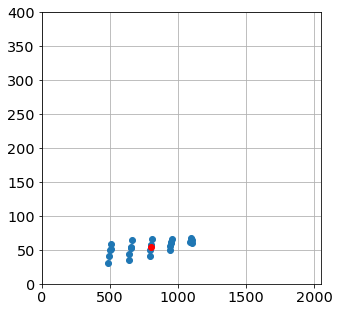

In [26]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
        y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

## Pointing positions before rotations

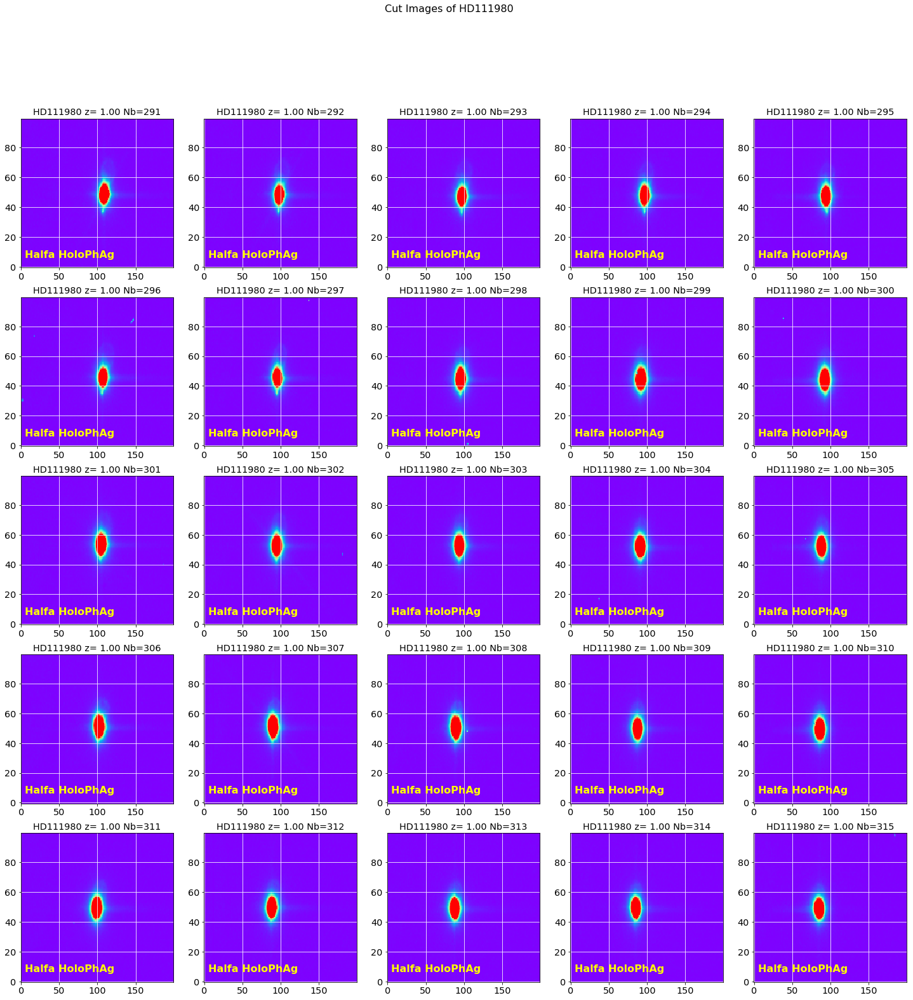

In [27]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [28]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  21.9836497089 13.0 47.4595959552
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 107.867892428 48.0087075368 ... 60701.0 9.58096787221 -2.45352345963
----------------------------------------------------------------
1  mean, median, std =  21.3843040024 13.0 45.1455270891
 id   xcentroid    ycentroid   ...   peak       flux          mag      
--- ------------- ------------ ... ------- ------------- --------------
  1 98.1508826582 47.657852455 ... 60701.0 10.3482695931 -2.53716933607
----------------------------------------------------------------
2  mean, median, std =  20.4823850982 13.0 43.2937337447
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 97.1247594096 46.7628495912 ... 60702.0 11.152957

[[  497.86789243   298.00870754]
 [  648.15088266   297.65785245]
 [  797.12475941   296.76284959]
 [  946.64001591   297.06182603]
 [ 1094.43143191   296.69360421]
 [  496.50342243   445.06302762]
 [  645.7174743    444.7805625 ]
 [  795.46348802   443.81617926]
 [  942.08425986   443.91154551]
 [ 1092.83616448   443.24250278]
 [  494.13893081   592.73352969]
 [  644.94721918   591.93806357]
 [  793.96189758   591.77582076]
 [  941.10432334   590.95123596]
 [ 1088.47434731   591.52059221]
 [  491.31784562   740.5881709 ]
 [  639.49525828   740.45634982]
 [  788.96500879   739.70151146]
 [  937.71372783   739.45792224]
 [ 1086.40259017   738.87823179]
 [  488.19115789   888.94144489]
 [  638.06323339   889.37650682]
 [  787.47274078   888.61263385]
 [  935.14594105   888.73325607]
 [ 1085.22009503   888.27973522]]
[509.45655733204524, 658.32365495090096, 806.02698547505361, 954.30207507998807, 1100.9768443965929, 506.47512708886109, 654.30393099050298, 803.36627669359541, 949.297775945

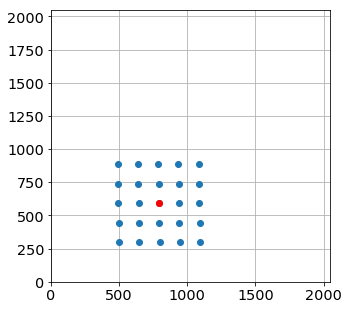

In [192]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    for ss in s:
        x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
        y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [193]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

IndexError: list index out of range

# Extract spectra
===================================

In [32]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [33]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


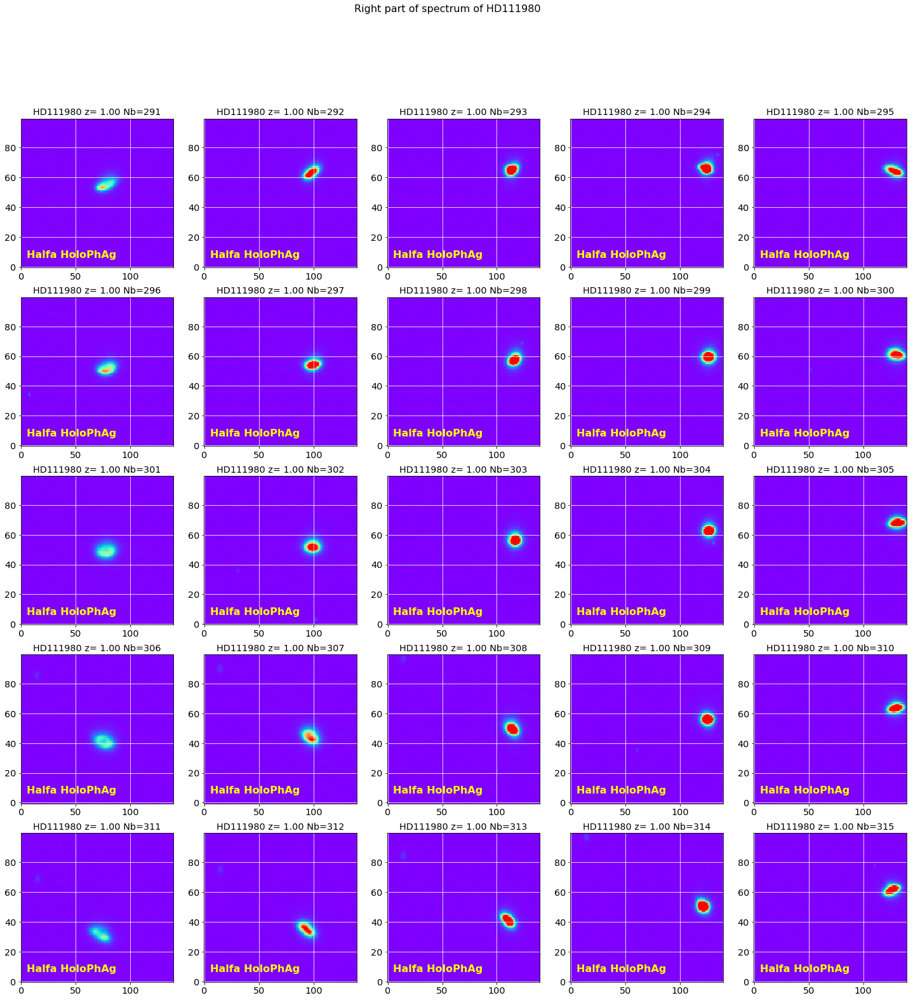

In [200]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+500))
ShowCenterImages(x_guess_right,y_star,[70]*len(all_images),[70]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

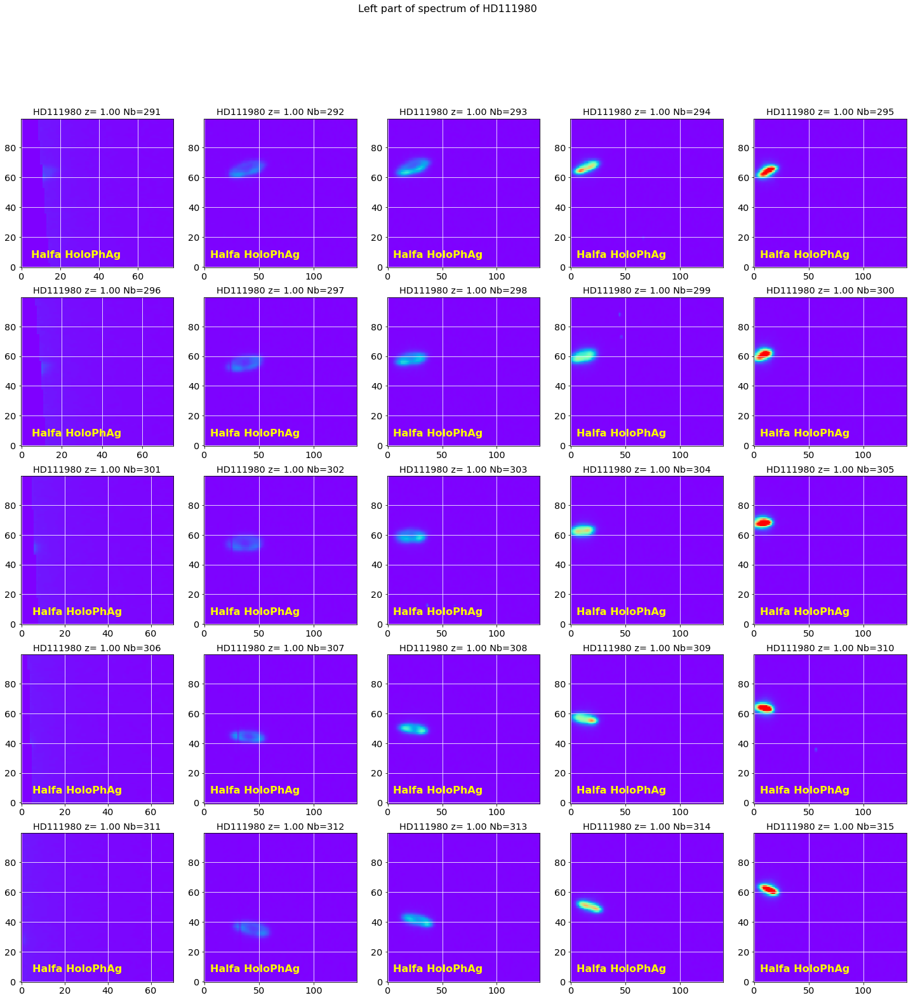

In [201]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-500))
ShowCenterImages(x_guess_left,y_star,[70]*len(all_images),[70]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[58,
 64,
 66,
 66,
 64,
 51,
 54,
 57,
 59,
 60,
 49,
 52,
 57,
 62,
 68,
 40,
 44,
 49,
 56,
 63,
 31,
 35,
 41,
 50,
 61]

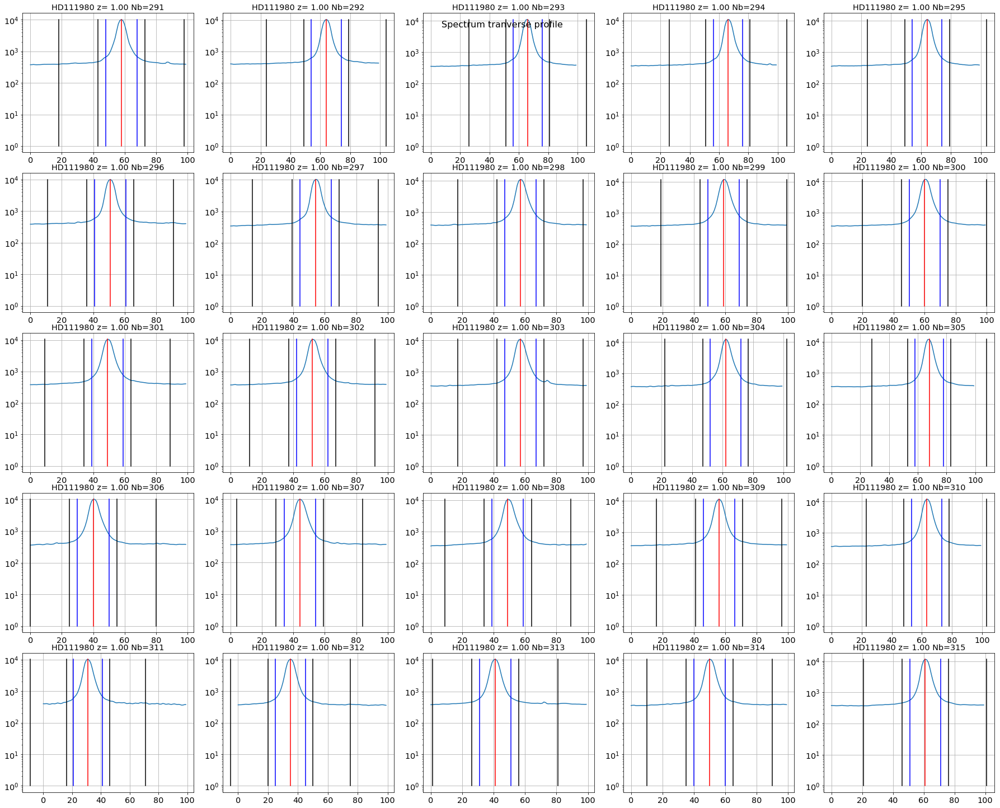

In [36]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=10,ws=[15,40],right_edge=1800)

In [202]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[15,40],right_edge=IMSIZE)

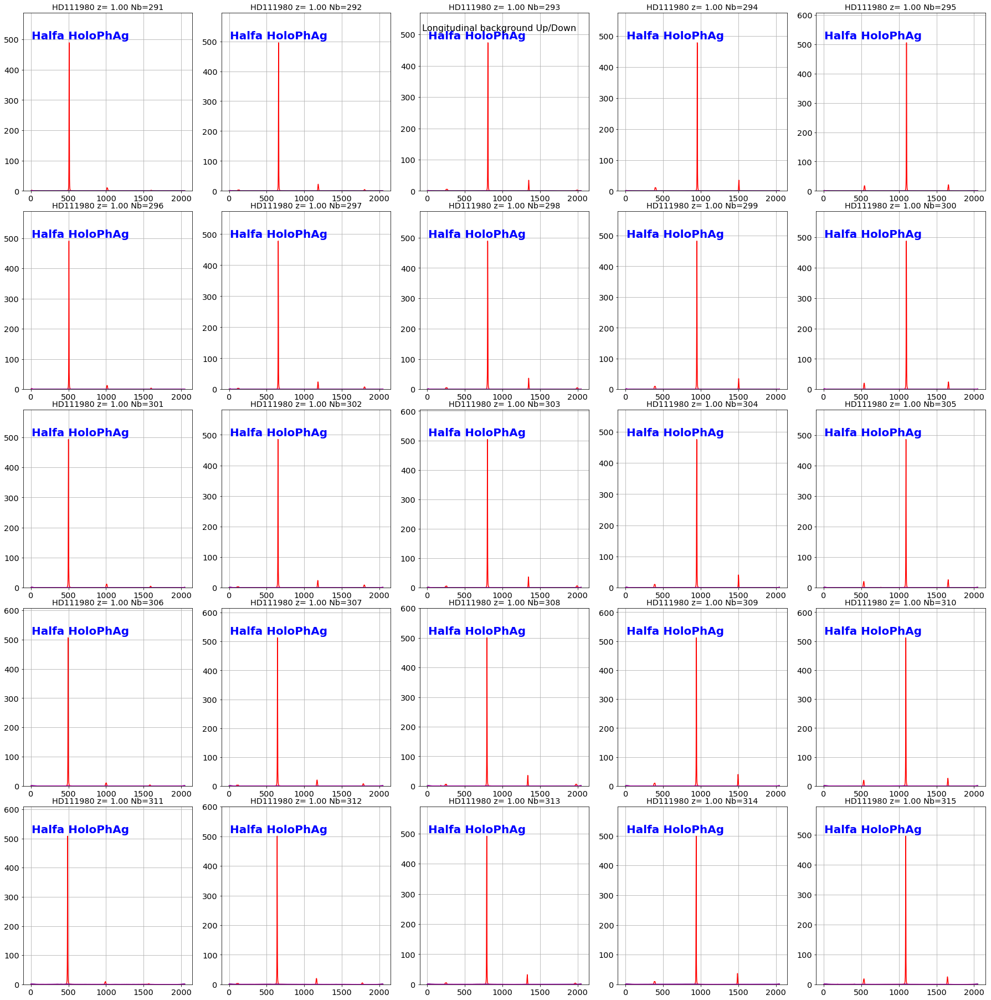

In [203]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 800.0)

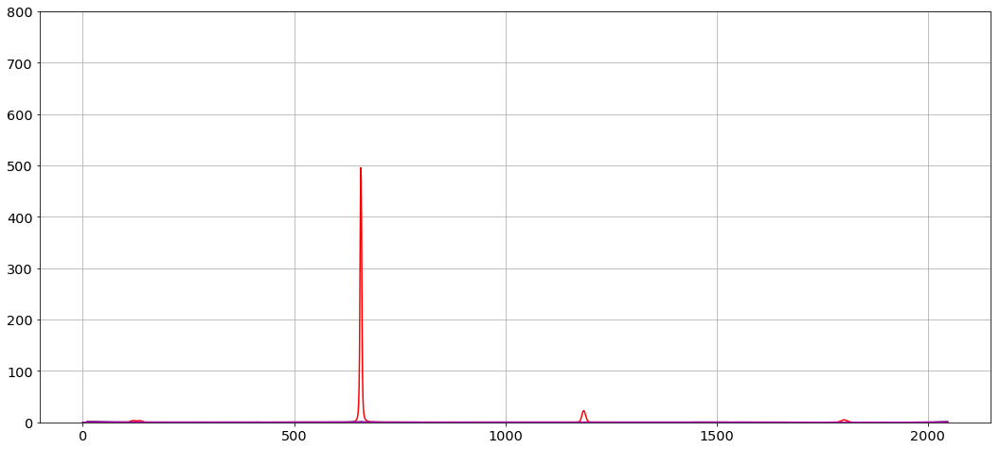

In [204]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,800.)

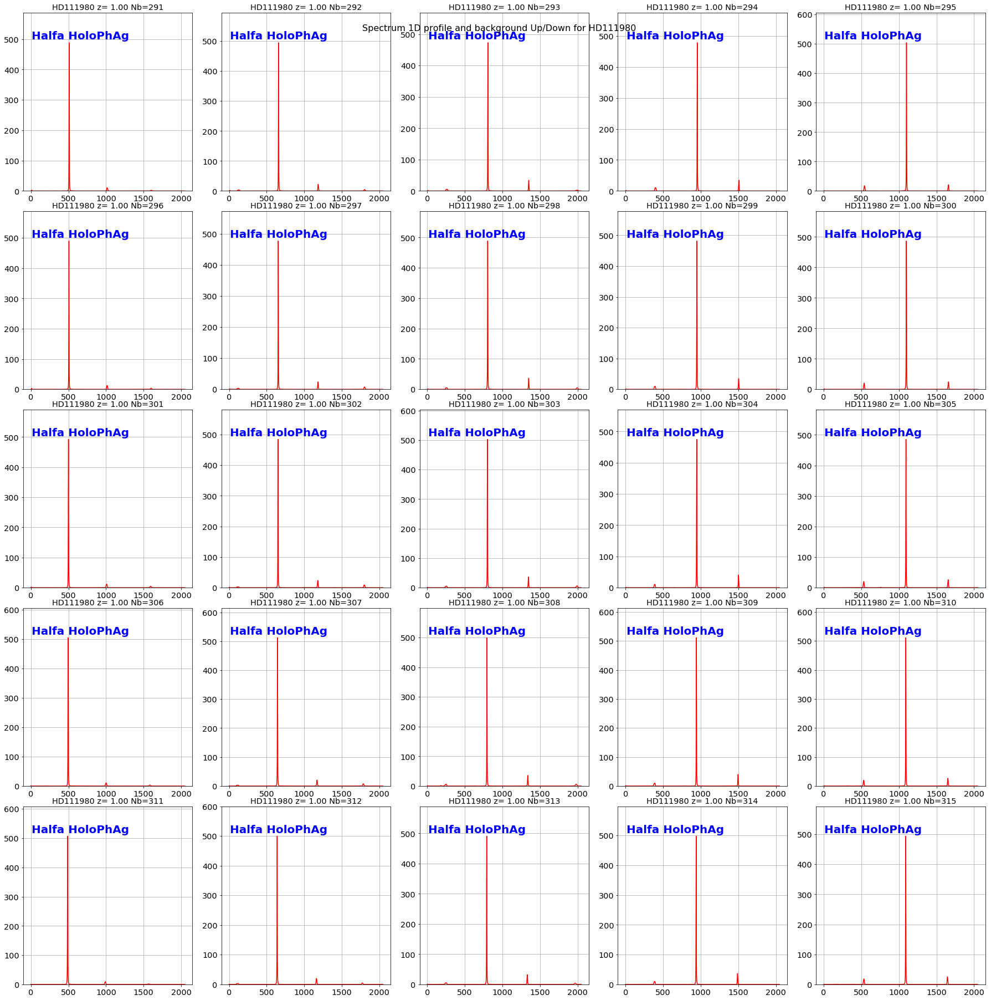

In [205]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Halfa HoloPhAg:	 gaussian center x=509.46+/-0.03
Halfa HoloPhAg:	 gaussian center x=658.30+/-0.02
Halfa HoloPhAg:	 gaussian center x=806.01+/-0.03
Halfa HoloPhAg:	 gaussian center x=954.33+/-0.03
Halfa HoloPhAg:	 gaussian center x=1100.94+/-0.03
Halfa HoloPhAg:	 gaussian center x=506.46+/-0.02
Halfa HoloPhAg:	 gaussian center x=654.34+/-0.03
Halfa HoloPhAg:	 gaussian center x=803.35+/-0.03
Halfa HoloPhAg:	 gaussian center x=949.34+/-0.03
Halfa HoloPhAg:	 gaussian center x=1098.97+/-0.03
Halfa HoloPhAg:	 gaussian center x=500.31+/-0.03
Halfa HoloPhAg:	 gaussian center x=651.06+/-0.03
Halfa HoloPhAg:	 gaussian center x=799.97+/-0.03
Halfa HoloPhAg:	 gaussian center x=947.10+/-0.03
Halfa HoloPhAg:	 gaussian center x=1094.33+/-0.03
Halfa HoloPhAg:	 gaussian center x=495.43+/-0.04
Halfa HoloPhAg:	 gaussian center x=643.60+/-0.04
Halfa HoloPhAg:	 gaussian center x=793.56+/-0.03
Halfa HoloPhAg:	 gaussian center x=942.76+/-0.03
Halfa HoloPhAg:	 gaussian center x=1092.31+/-0.03
Halfa HoloPhAg:	

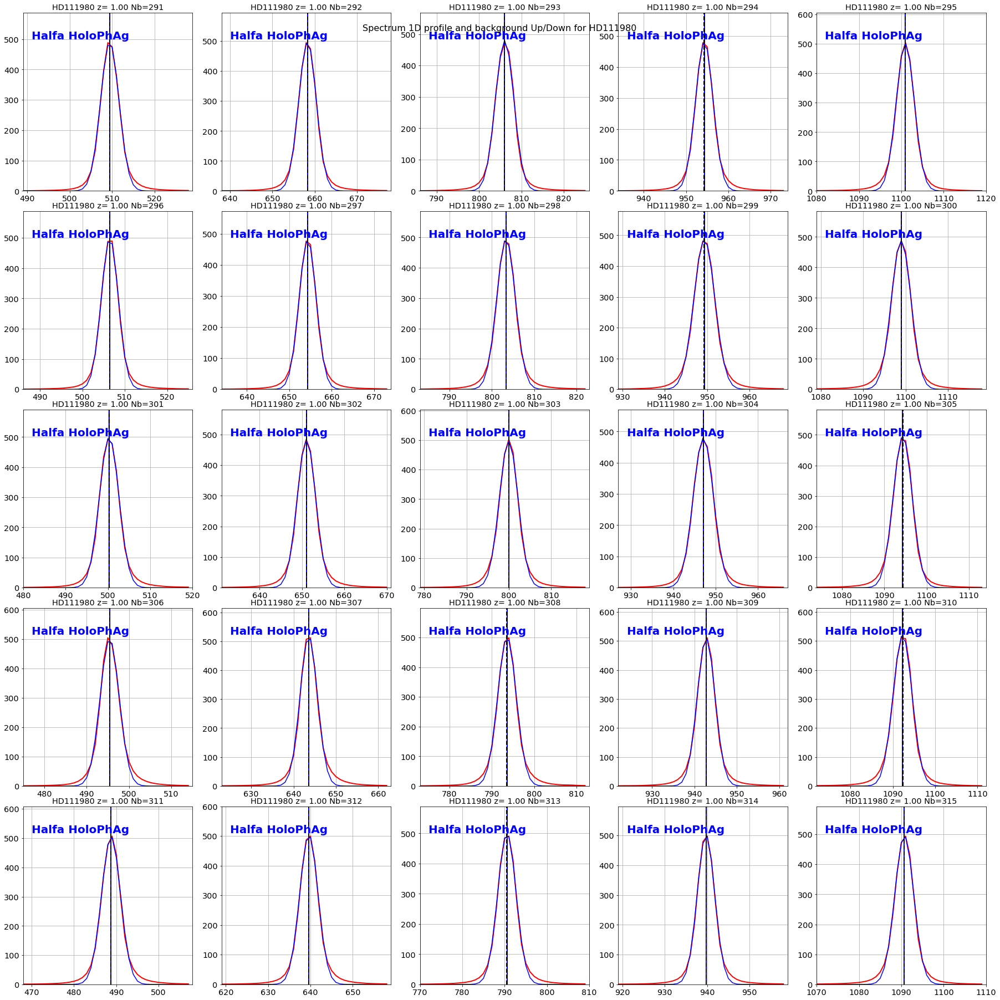

In [206]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

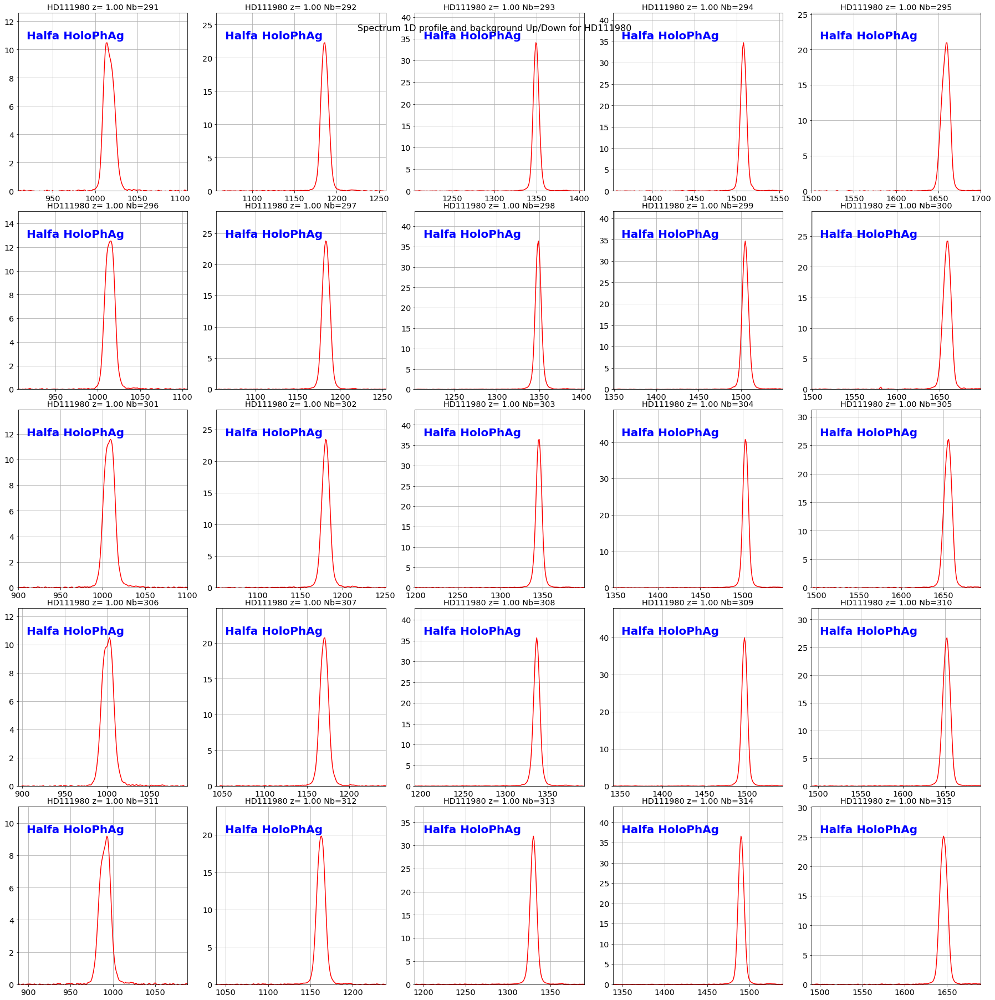

In [207]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

Halfa HoloPhAg:	 gaussian center x=1016.13+/-0.07
Halfa HoloPhAg:	 gaussian center x=1185.85+/-0.01
Halfa HoloPhAg:	 gaussian center x=1349.33+/-0.01
Halfa HoloPhAg:	 gaussian center x=1507.95+/-0.01
Halfa HoloPhAg:	 gaussian center x=1658.56+/-0.04
Halfa HoloPhAg:	 gaussian center x=1014.36+/-0.04
Halfa HoloPhAg:	 gaussian center x=1183.40+/-0.01
Halfa HoloPhAg:	 gaussian center x=1348.82+/-0.01
Halfa HoloPhAg:	 gaussian center x=1505.09+/-0.01
Halfa HoloPhAg:	 gaussian center x=1659.16+/-0.02
Halfa HoloPhAg:	 gaussian center x=1007.70+/-0.04
Halfa HoloPhAg:	 gaussian center x=1180.12+/-0.01
Halfa HoloPhAg:	 gaussian center x=1345.60+/-0.01
Halfa HoloPhAg:	 gaussian center x=1503.43+/-0.01
Halfa HoloPhAg:	 gaussian center x=1655.17+/-0.02
Halfa HoloPhAg:	 gaussian center x=1000.83+/-0.05
Halfa HoloPhAg:	 gaussian center x=1170.25+/-0.02
Halfa HoloPhAg:	 gaussian center x=1336.99+/-0.01
Halfa HoloPhAg:	 gaussian center x=1497.16+/-0.01
Halfa HoloPhAg:	 gaussian center x=1651.52+/-0.01


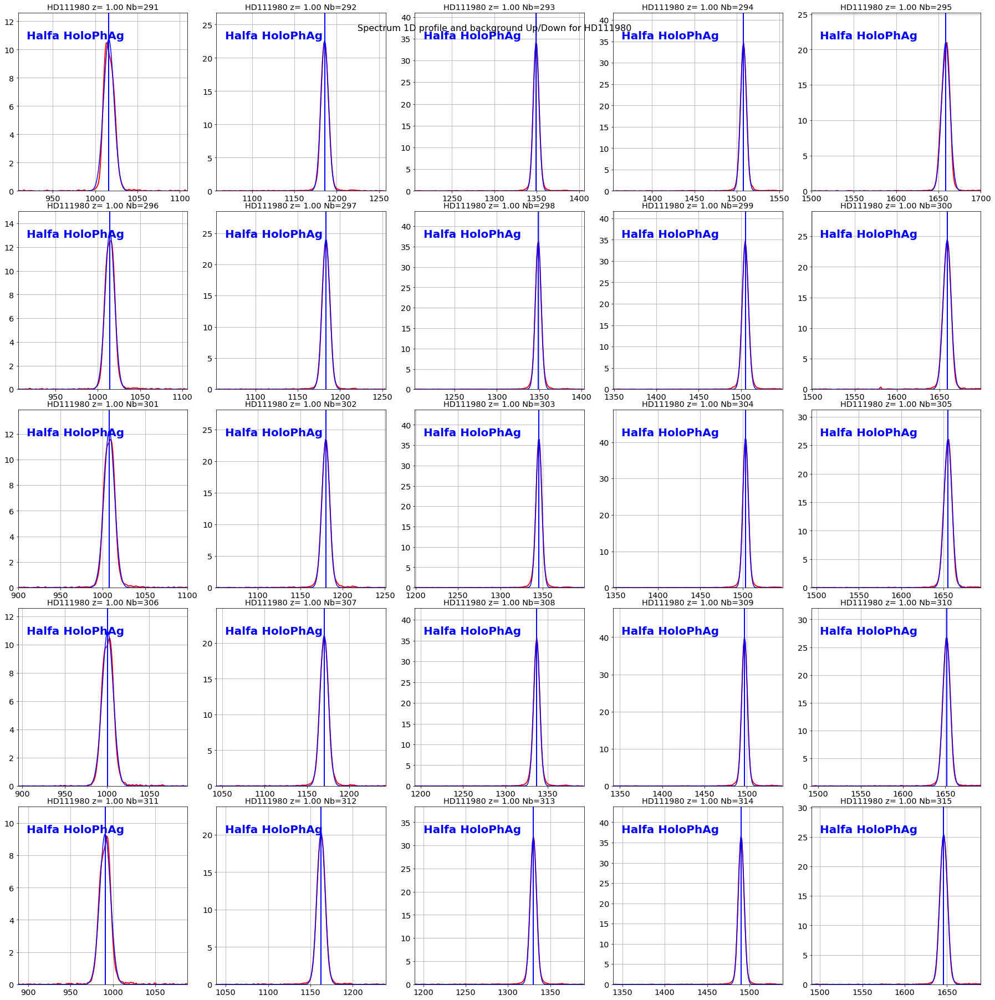

In [208]:
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_right,guess=[10,1320,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile2.pdf')
plt.savefig(figfilename)  

Halfa HoloPhAg:	 gaussian center x=236.62+/-inf
Halfa HoloPhAg:	 gaussian center x=126.72+/-0.26
Halfa HoloPhAg:	 gaussian center x=259.06+/-0.19
Halfa HoloPhAg:	 gaussian center x=398.15+/-0.10
Halfa HoloPhAg:	 gaussian center x=542.08+/-0.03
Halfa HoloPhAg:	 gaussian center x=10.16+/-0.03
Halfa HoloPhAg:	 gaussian center x=121.92+/-0.29
Halfa HoloPhAg:	 gaussian center x=254.40+/-0.19
Halfa HoloPhAg:	 gaussian center x=390.77+/-0.09
Halfa HoloPhAg:	 gaussian center x=537.33+/-0.03
Halfa HoloPhAg:	 gaussian center x=118.66+/-0.29
Halfa HoloPhAg:	 gaussian center x=251.05+/-0.20
Halfa HoloPhAg:	 gaussian center x=388.03+/-0.08
Halfa HoloPhAg:	 gaussian center x=532.15+/-0.04
Halfa HoloPhAg:	 gaussian center x=113.65+/-0.34
Halfa HoloPhAg:	 gaussian center x=246.63+/-0.21
Halfa HoloPhAg:	 gaussian center x=385.82+/-0.12
Halfa HoloPhAg:	 gaussian center x=531.62+/-0.03
Halfa HoloPhAg:	 gaussian center x=113.12+/-0.31
Halfa HoloPhAg:	 gaussian center x=247.56+/-0.21
Halfa HoloPhAg:	 gauss

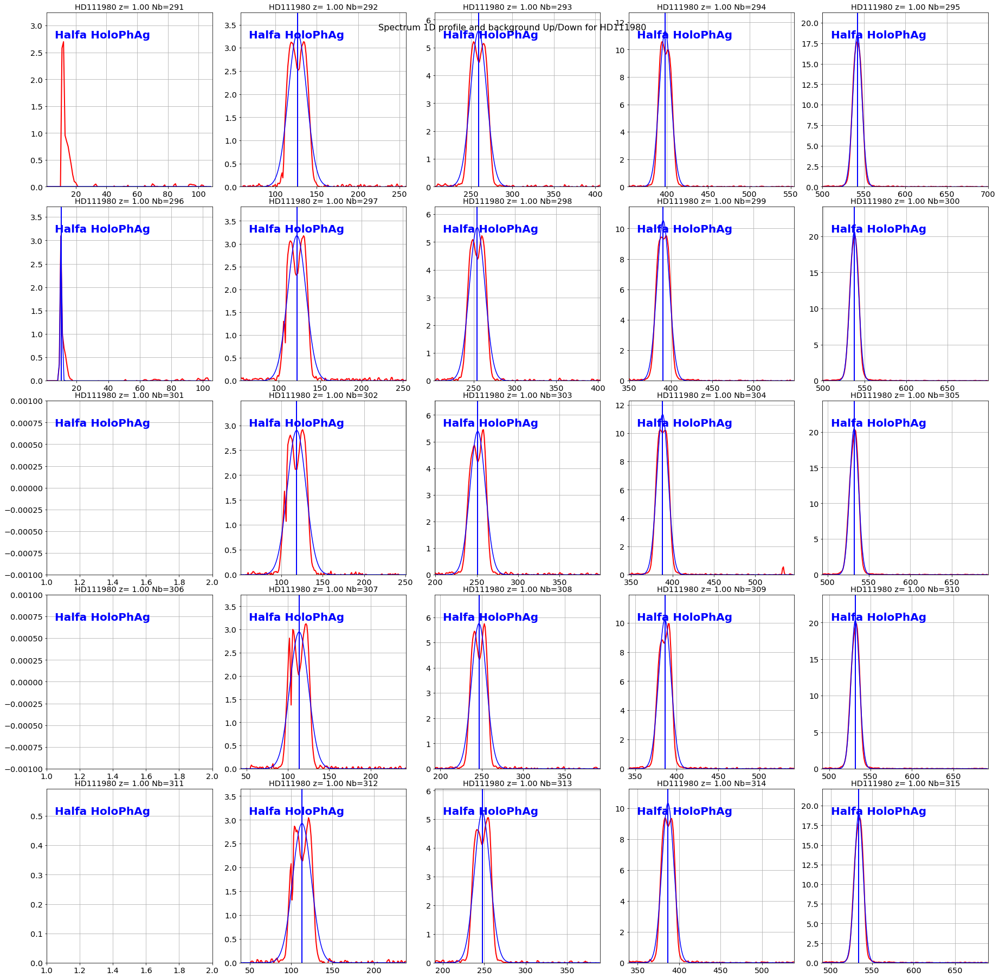

In [209]:
# Left profile
right_edge = thecorrspectra[0].shape[0]
xlims_left = []
for x in x_guess_left :
    if x == 1 :
        xlims_left.append([1,2])
    else :
        xlims_left.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_left,guess=[1,200,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_leftprofile2.pdf')
plt.savefig(figfilename)  

## Resolution of the hologram

With the +1 order only (-1 order is too unfocused)

In [210]:
guess = [1,1320,50]
N_rightorder, N_rightorder_err = GratingResolution_OneOrder(thecorrspectra,
                                        x_star,order0_positions,all_images,all_filt,xlims_right,guess,order=+1)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa HoloPhAg
N=326.7 +/- 1.1 lines/mm	 H-alpha FWHM=14.5pix with res=1.017nm/pix : FWHM=14.7nm	 ie finesse=78.9
Transverse profile FWHM=6.5pix 
-------------------------------
Halfa HoloPhAg
N=339.5 +/- 1.1 lines/mm	 H-alpha FWHM=10.5pix with res=0.899nm/pix : FWHM=9.4nm	 ie finesse=219.0
Transverse profile FWHM=5.5pix 
-------------------------------
Halfa HoloPhAg
N=349.1 +/- 1.1 lines/mm	 H-alpha FWHM=8.0pix with res=0.799nm/pix : FWHM=6.4nm	 ie finesse=-81512.0
Transverse profile FWHM=5.0pix 
-------------------------------
Halfa HoloPhAg
N=355.3 +/- 1.2 lines/mm	 H-alpha FWHM=8.3pix with res=0.716nm/pix : FWHM=5.9nm	 ie finesse=-1325.3
Transverse profile FWHM=5.1pix 
-------------------------------
Halfa HoloPhAg
N=357.7 +/- 1.2 lines/mm	 H-alpha FWHM=11.5pix with res=0.649nm/pix : FWHM=7.5nm	 ie finesse=611.4
Transverse profile FWHM=5.0pix 
-------------------------------
Halfa HoloPhAg
N=327.4 +/- 1.1 lines/mm	 H-alp

With the two orders

In [211]:
from holo_specs import *
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,all_images,all_filt,
                        leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,100],[1,1320,50]])

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa HoloPhAg
N=323.9 +/- 1.1 lines/mm
Right order: H-alpha FWHM=14.5pix with res=1.247nm/pix : FWHM=18.0nm	 ie finesse=56.4
Left  order: H-alpha FWHM=2.0pix with res=1.247nm/pix : FWHM=2.5nm	 ie finesse=-168.3
Transverse profile FWHM :  6.5pix (right)  15.3pix (left)
-------------------------------
Halfa HoloPhAg
N=340.6 +/- 1.1 lines/mm
Right order: H-alpha FWHM=10.5pix with res=1.177nm/pix : FWHM=12.3nm	 ie finesse=111.1
Left  order: H-alpha FWHM=26.1pix with res=1.177nm/pix : FWHM=30.8nm	 ie finesse=26.9
Transverse profile FWHM :  5.5pix (right)  9.9pix (left)
-------------------------------
Halfa HoloPhAg
N=350.1 +/- 1.1 lines/mm
Right order: H-alpha FWHM=8.0pix with res=1.140nm/pix : FWHM=9.1nm	 ie finesse=241.2
Left  order: H-alpha FWHM=23.2pix with res=1.140nm/pix : FWHM=26.5nm	 ie finesse=32.7
Transverse profile FWHM :  5.0pix (right)  8.4pix (left)
-------------------------------
Halfa HoloPhAg
N=356.0 +/- 1.2 line

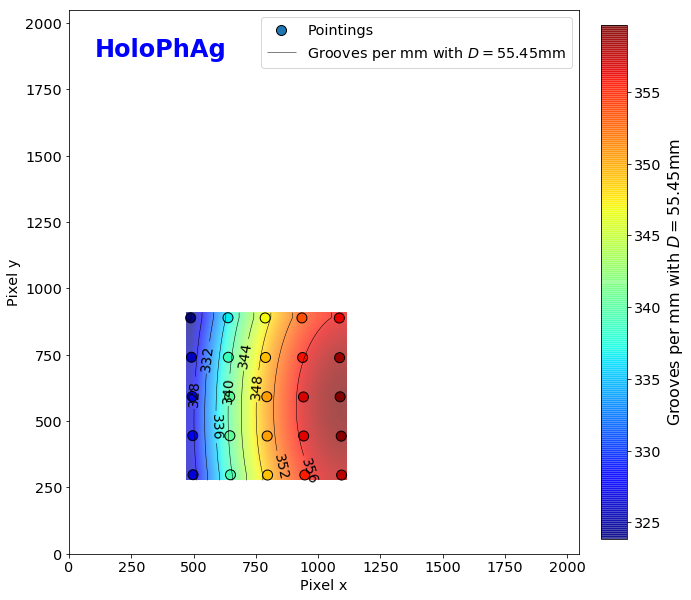

In [212]:
margin = 20

y_N = []
x_N = []
#d = []
N = []
for k in range(len(N_rightorder)):
    if np.isnan(N_rightorder[k]) : continue
    y_N.append((order0_positions.T)[1][k])
    x_N.append((order0_positions.T)[0][k])
    #d.append(distances[k])
    N.append(N_rightorder[k])
N_xx,N_yy,N_z,N_interp = scatter_interpol(np.array([x_N,y_N]).T,N,margin=margin,kind='cubic')

fig = plt.figure(figsize=(10,10))
plt.scatter(x_N, y_N, c=N, s=100, cmap=cm.jet, marker='o', vmin=np.min(N), vmax=np.max(N),edgecolors='k',label='Pointings')
im = plt.imshow(N_z, extent=[np.min(x_N)-margin, np.max(x_N)+margin, np.min(y_N)-margin, np.max(y_N)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),horizontalalignment='left',
             verticalalignment='top',fontweight='bold',color='blue',fontsize=24,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fmt='%d',fontweight='bold')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Grooves per mm with $D=%.4g$mm'% DISTANCE2CCD,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_resolution.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Save grating resolution

In [213]:
N = []
Nerr = []
for k in range(len(N_rightorder)):
    if np.isnan(N_rightorder[k]): continue
    N.append(N_rightorder[k])
    Nerr.append(N_rightorder_err[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 345.69 +/- 1.12 /mm (0.33 percent)


## Save spectra

In [214]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[-1]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec

total 1608
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_291.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_292.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_293.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_294.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_295.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_296.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_297.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_298.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_299.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_300.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_301.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:55 finalSpectra_20170609_302.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû

## Analyse angles to find hologram center

### with line crossing

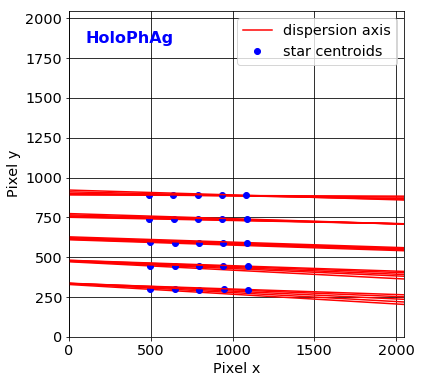

In [215]:
plot_dispersion_axis(order0_positions,all_theta,holo_name=holo_name)

Hologram center at x0 = 1094.4 and y0 = 581.5 with average tilt of -1.9 degrees


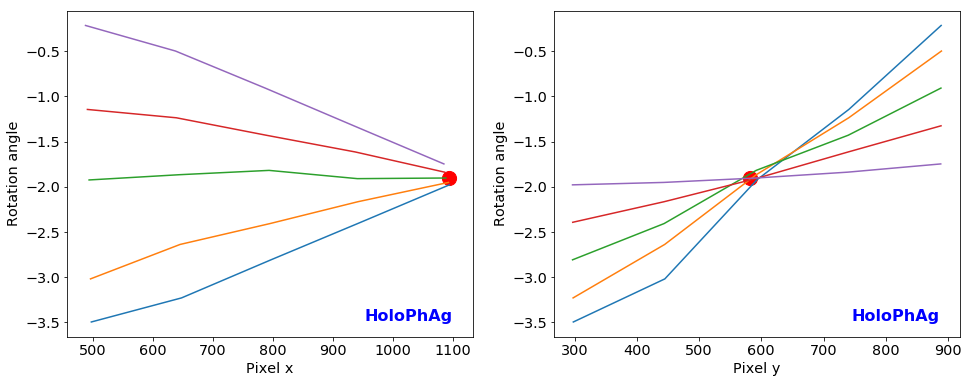

In [216]:
proj_x_lines, proj_y_lines = RotationLines(all_theta,order0_positions)
x_center, y_center, theta0 = FindHoloCenter(all_theta,order0_positions,proj_x_lines, proj_y_lines)

plot_rotation_lines(proj_x_lines,proj_y_lines,holo_name=holo_name,center=[x_center, y_center, theta0])

### with surface analysis

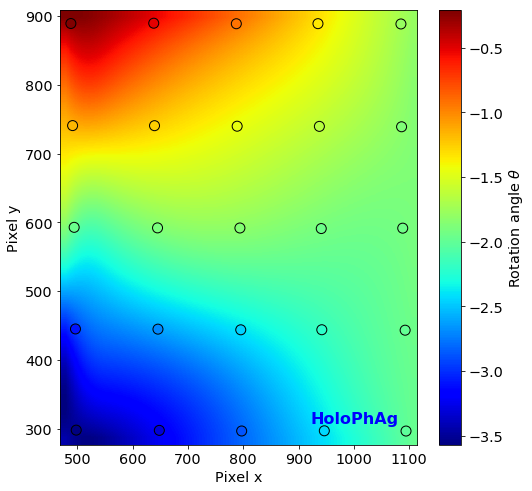

In [217]:
theta_xx,theta_yy,theta_z,theta_interp = scatter_interpol(order0_positions,all_theta,margin=10,kind='cubic',
                                        plot=True,holo_name=holo_name,zlabel='Rotation angle $\\theta$')

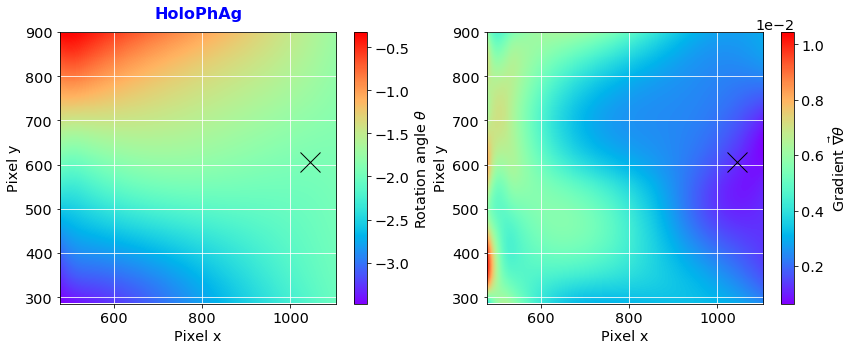

Minimum gradient of image: 0.000632566138874
Hessian determinant at minimum: -7.99316023748e-11 (if negative: saddle point)
Center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.91 degrees


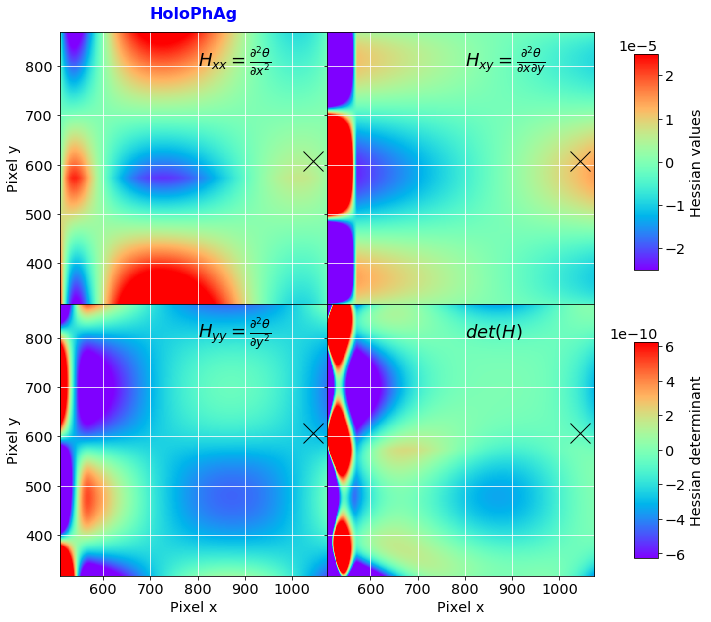

In [218]:
margin = 30

surface_gradient(theta_xx,theta_yy,theta_z,margin=margin,plot=True,holo_name=holo_name,dir_top_images=dir_top_images)

x_center, y_center, theta_tilt = saddle_point(theta_xx,theta_yy,theta_z,theta_interp,margin=margin,plot=True,verbose=True,
                                holo_name=holo_name,vmin=-0.000025,vmax=0.000025,dir_top_images=dir_top_images) 

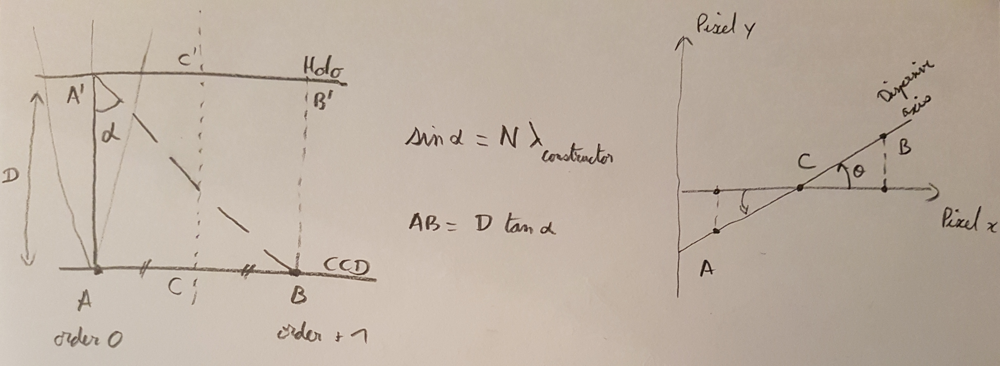

In [219]:
Image(filename='../../common_tools/pictures/hologram_centers.jpg')

Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)
-----------------------------
Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)
At order 0 position: N=349.55 grooves/mm and theta=-1.74 degrees


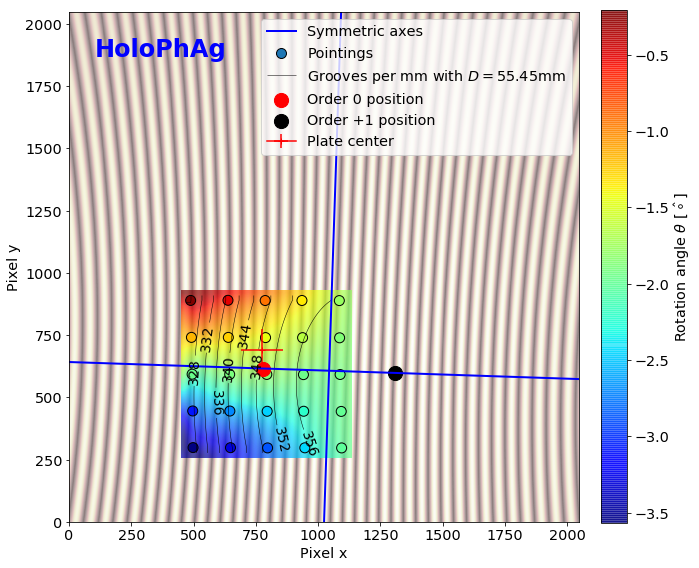

In [220]:
from holo_specs import *
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],N_interp,theta_interp)

print '-----------------------------'
H = Hologram(holo_name)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fontweight='bold',fmt='%d')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

The two methods are coherent.

## Save results

In [221]:
dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
print 'Save results in ',dirname
print '--------------------------------------------------------------'
textfilename=os.path.join(dirname,'hologram_rotation_angles.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], all_theta[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star theta_in_degree",fmt='%.3f')

textfilename=os.path.join(dirname,'hologram_grooves_per_mm.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], N_rightorder[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star grooves_per_mm grooves_per_mm_err",fmt='%.3f')

text = "#x_center y_center theta_tilt_in_degree\n" 
text += "%.3f %.3f %.3f\n" % (x_center, y_center, theta_tilt)
textfilename = dirname+"/hologram_center.txt"
print textfilename
f=open(textfilename,'w')
f.write(text)
f.close()

Save results in  ../../common_tools/data/HoloPhAg
--------------------------------------------------------------
../../common_tools/data/HoloPhAg/hologram_rotation_angles.txt
../../common_tools/data/HoloPhAg/hologram_grooves_per_mm.txt
../../common_tools/data/HoloPhAg/hologram_center.txt


In [222]:
print 'Test:'
print '--------------------------------------------------------------'
H = Hologram(holo_name)

Test:
--------------------------------------------------------------
Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)
At order 0 position: N=349.56 grooves/mm and theta=-1.74 degrees
